推論用notebook → https://www.kaggle.com/hutch1221/inference-cassava-classification

## 変更仕様(from baseline)
* augmentationのクラス化、private dataset に退避 https://github.com/Taichicchi1221/tf-image-classification
* random_rotation, FMixの実装
* bi-tempered lossを追加(LOSS_TYPE="BTL"で指定) https://github.com/Diulhio/bitemperedloss-tf
* External datasetを追加（2019年cassavaコンペのもの）https://www.kaggle.com/c/cassava-disease
* TTAの実装(oofで評価)
* Image Normalization実装（フラグ"IMAGE_NORMALIZATION"で管理）
* ViTモデルの指定（バッチサイズ小さめにしないとダメ）
* batchwise でcosine annealing

In [1]:
# don't need for inference
!pip install -q -U tensorflow==2.3.2
!pip install -q -U tensorflow_addons==0.12.0

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
osmnx 1.0.1 requires numpy>=1.19, but you have numpy 1.18.5 which is incompatible.
bokeh 2.2.3 requires tornado>=5.1, but you have tornado 5.0.2 which is incompatible.
You should consider upgrading via the '/opt/conda/bin/python3.7 -m pip install --upgrade pip' command.
You should consider upgrading via the '/opt/conda/bin/python3.7 -m pip install --upgrade pip' command.


In [2]:
print("update TPU server tensorflow version...")

!pip install -q cloud-tpu-client
import tensorflow as tf
from cloud_tpu_client import Client
try:
    Client().configure_tpu_version(tf.__version__, restart_type='ifNeeded')
except:
    print("Configure Error!")

update TPU server tensorflow version...
You should consider upgrading via the '/opt/conda/bin/python3.7 -m pip install --upgrade pip' command.


In [3]:
!pip install -q /kaggle/input/keras-efficientnet-whl/Keras_Applications-1.0.8-py3-none-any.whl
!pip install -q /kaggle/input/keras-efficientnet-whl/efficientnet-1.1.1-py3-none-any.whl
!pip install -q /kaggle/input/keras-pretrained-imagenet-weights/image_classifiers-1.0.0-py3-none-any.whl
!pip install -q /kaggle/input/vit-keras/validators-0.18.2-py3-none-any.whl
!pip install -q /kaggle/input/vit-keras/vit_keras-0.0.10-py3-none-any.whl

You should consider upgrading via the '/opt/conda/bin/python3.7 -m pip install --upgrade pip' command.
You should consider upgrading via the '/opt/conda/bin/python3.7 -m pip install --upgrade pip' command.
You should consider upgrading via the '/opt/conda/bin/python3.7 -m pip install --upgrade pip' command.
You should consider upgrading via the '/opt/conda/bin/python3.7 -m pip install --upgrade pip' command.
You should consider upgrading via the '/opt/conda/bin/python3.7 -m pip install --upgrade pip' command.


In [4]:
import os
import sys
import re
import math
import time
import gc
import random
import json
from tqdm import tqdm
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
import tensorflow_addons as tfa
from kaggle_datasets import KaggleDatasets
from sklearn.metrics import f1_score, precision_score, recall_score, confusion_matrix, accuracy_score
from sklearn.model_selection import KFold, StratifiedKFold

In [5]:
sys.path.append("/kaggle/input/tf-bi-tempered-loss")
from tf_bi_tempered_loss import BiTemperedLogisticLoss
import efficientnet.tfkeras as efn
from classification_models.tfkeras import Classifiers
from vit_keras import vit, utils

In [6]:
# codes from private dataset
sys.path.append("/kaggle/input/tf-augmentation-class/")
from augmentation import SingleImageAugmentator, MixImageAugmentator

# Configurations

In [7]:
AUTO = tf.data.experimental.AUTOTUNE

# Detect hardware, return appropriate distribution strategy
try:
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver()  # TPU detection. No parameters necessary if TPU_NAME environment variable is set. On Kaggle this is always the case.
    print('Running on TPU ', tpu.master())
except ValueError:
    tpu = None

if tpu:
    tf.config.experimental_connect_to_cluster(tpu)
    tf.tpu.experimental.initialize_tpu_system(tpu)
    strategy = tf.distribute.experimental.TPUStrategy(tpu)
else:
    strategy = tf.distribute.get_strategy() # default distribution strategy in Tensorflow. Works on CPU and single GPU.
    gpus = tf.config.experimental.list_physical_devices('GPU')
    if gpus:
        # Restrict TensorFlow to only use the first GPU
        try:
            for gpu in gpus:
                tf.config.experimental.set_memory_growth(gpu, True)
            tf.config.experimental.set_visible_devices(gpus[0], 'GPU')
            logical_gpus = tf.config.experimental.list_logical_devices('GPU')
            print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPU")
        except RuntimeError as e:
            # Visible devices must be set before GPUs have been initialized
            print(e)
    
REPLICAS = strategy.num_replicas_in_sync
print("REPLICAS: ", REPLICAS)

Running on TPU  grpc://10.0.0.2:8470
REPLICAS:  8


In [8]:
def seed_everything(seed=13):
    np.random.seed(seed)
    tf.random.set_seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    os.environ['TF_DETERMINISTIC_OPS'] = '1'
    os.environ['TF_KERAS'] = '1'
    random.seed(seed)

In [9]:
CFG = {
    # CFG Experiment
    "EXPERIMENT_TAG": "exp45",
    
    # CFG Data
    "DATA_TYPE": "CROP-RESIZED",
    "USE_EXTERNAL_DATA": True,
    
    # CFG seed
    "SEED": 1222,
    
    # Base CFG
    "NUM_CLASSES": 5,
    "CHANNELS": 3,
    
    # CFG Resize
    "IMAGE_SIZE": [384, 384],
    "RANDOM_CROP": True,

    # CFG Preprocess
    "IMAGE_NORMALIZATION": True,
    "NORMALIZATION_MEAN": [0.42984136, 0.49624753, 0.3129598], # mean and std from this competition's dataset
    "NORMALIZATION_STD": [0.21417203, 0.21910103, 0.19542212], # mean and std from this competition's dataset
    # "NORMALIZATION_MEAN" = [0.485, 0.456, 0.406], # mean and std from imagenet dataset
    # "NORMALIZATION_STD" = [0.229, 0.224, 0.225], # mean and std from imagenet dataset

    
    # CFG Batch
    "BATCH_SIZE": 32 * REPLICAS,
    "AUG_BATCH": 64,
    
    # CFG Augmentation
    "DO_AUG": True,
    "RANDOM_FLIP_LEFT_RIGHT": True,
    "RANDOM_FLIP_UP_DOWN": True,
    "RANDOM_ROTATION": True,
    "RANDOM_ROTATION_RANGE": 45,
    "RANDOM_ROTATION_FILL_MODE": "reflect", # one of {'constant', 'reflect', 'wrap', 'nearest'}
    "RANDOM_BRIGHTNESS": True,
    "RANDOM_BRIGHTNESS_MAX_DELTA": 0.2,
    "RANDOM_CONTRAST": False,
    "RANDOM_CONTRAST_LOWER": 0.6,
    "RANDOM_CONTRAST_UPPER": 1.4,
    "RANDOM_HUE": False,
    "RANDOM_HUE_MAX_DELTA": 0.07,
    "RANDOM_SATURATION": False,
    "RANDOM_SATURATION_LOWER": 0.5,
    "RANDOM_SATURATION_UPPER": 1.5,

    # CFG Mix Augmentation
    "DO_MIX_AUG": True,
    "MIXUP_PROB": 0.00,
    "MIXUP_ALPHA": 1.0,
    "CUTMIX_PROB": 0.00,
    "CUTMIX_ALPHA": 1.0,
    "FMIX_PROB": 0.80,
    "FMIX_ALPHA": 1.0,
    "FMIX_DECAY": 3.0,

    # CFG Folds
    "FOLDS": 5,
    "FOLDS_SEED": 1222,
    
    # CFG Training
    "EPOCHS": 25,
    "EPOCHS_POST": 5,
    
    # CFG EarlyStopping
    "EARLY_STOPPING": False,
    "ES_MONITOR": "val_loss",
    "ES_MIN_DELTA": 0,
    "ES_PATIENCE": 5,
    
    # CFG ModelCheckpoint
    "MC_MONITOR": "val_accuracy",

    # CFG Model
    "MODEL_TAG": "EfficientNetB5",
    "INITIAL_WEIGHTS": "noisy-student", # one of {None, "imagenet", "noisy-student"} but "noisy-student" for only efficientnet
    "FREEZE_BN": True, # Freeze BatchNormalization Layers
    
    # CFG Model Config
    "LEARNING_RATE": 3e-05 * REPLICAS,
    "LR_FIRST_DECAY_STEPS": 5,
    
    "LOSS_TYPE": "BTL", # one of {'CCE', 'BTL'} 'CCE' means CategoricalCrossentropy and 'BTL' means BiTemperedLogistic
    "LABEL_SMOOTHING": 0.10,
    "BI_TEMPERED_LOSS_T1": 0.5, # works only if LOSS_TYPE == 'BTL'
    "BI_TEMPERED_LOSS_T2": 1.5, # works only if LOSS_TYPE == 'BTL'
    "N_ITER": 5, # works only if LOSS_TYPE == 'BTL'
    
    # CFG TTA
    "TTA": 12,
    
    # CFG COMMENT
    "MEMBER_NAME": "", #実行者名
    "COMMENT": "FMix only for mix augmentation / weak augmentation for last some epochs / random crop", #変更履歴等記入
}

INPUT_SHAPE = (*CFG["IMAGE_SIZE"], CFG["CHANNELS"])

print(f"INPUT SHAPE: {INPUT_SHAPE}")

INPUT SHAPE: (384, 384, 3)


## Base Model Tags
* ResNet18
* ResNet50
* ResNet50V2
* ResNet101
* ResNet101V2
* ResNet152
* ResNet152V2
* EfficientNetB0
* EfficientNetB1
* EfficientNetB2
* EfficientNetB3
* EfficientNetB4
* EfficientNetB5
* EfficientNetB6
* EfficientNetB7
* ResNeXt50
* ResNeXt101
* SeResNet50
* SeResNet101
* SeResNeXt50
* SeResNeXt101
* vit_b16
* vit_b32
* vit_l16
* vit_l32

In [10]:
class BaseModel:
    def __init__(self, model_tag, weights, freeze_bn, input_shape):
        self.model_tag = model_tag
        self.weights = weights
        self.freeze_bn = freeze_bn
        self.INPUT_SHAPE = input_shape
        self.ERR_MSG_WEIGHT = "weightの指定が不適です！"
        self.ERR_MSG_MODEL_TAG = "Model Tagの指定が不適です！"
    def __call__(self):
        if self.model_tag == "ResNet18":
            if self.weights is None:
                pass
            elif self.weights == "imagenet":
                self.weights = "/kaggle/input/keras-pretrained-imagenet-weights/resnet18_imagenet_1000_no_top.h5"
            else:
                raise NotImplementedError(self.ERR_MSG_WEIGHT)
            base_model = tf.keras.Sequential(
                    [
                        Classifiers.get('resnet18')[0](input_shape = self.INPUT_SHAPE, weights = self.weights, include_top = False),
                        tf.keras.layers.GlobalAveragePooling2D()
                    ]
                )
        elif self.model_tag == "ResNet50":
            if self.weights in [None, "imagenet"]:
                base_model = tf.keras.applications.ResNet50(input_shape = self.INPUT_SHAPE, weights = self.weights, include_top = False, pooling = "avg")
            else:
                raise NotImplementedError(self.ERR_MSG_WEIGHT)
        elif self.model_tag == "ResNet50V2":
            if self.weights in [None, "imagenet"]:
                base_model = tf.keras.applications.ResNet50V2(input_shape = self.INPUT_SHAPE, weights = self.weights, include_top = False, pooling = "avg")
            else:
                raise NotImplementedError(self.ERR_MSG_WEIGHT)
        elif self.model_tag == "ResNet101":
            if self.weights in [None, "imagenet"]:
                base_model = tf.keras.applications.ResNet101(input_shape = self.INPUT_SHAPE, weights = self.weights, include_top = False, pooling = "avg")
            else:
                raise NotImplementedError(self.ERR_MSG_WEIGHT)
        elif self.model_tag == "ResNet101":
            if self.weights in [None, "imagenet"]:
                base_model = tf.keras.applications.ResNet101V2(input_shape = self.INPUT_SHAPE, weights = self.weights, include_top = False, pooling = "avg")
            else:
                raise NotImplementedError(self.ERR_MSG_WEIGHT)
        elif self.model_tag == "EfficientNetB0":
            if self.weights in [None, "imagenet", "noisy-student"]:
                base_model = efn.EfficientNetB0(input_shape = self.INPUT_SHAPE, weights = self.weights, include_top = False, pooling = "avg")
            else:
                raise NotImplementedError(self.ERR_MSG_WEIGHT)
        elif self.model_tag == "EfficientNetB1":
            if self.weights in [None, "imagenet", "noisy-student"]:
                base_model = efn.EfficientNetB1(input_shape = self.INPUT_SHAPE, weights = self.weights, include_top = False, pooling = "avg")
            else:
                raise NotImplementedError(self.ERR_MSG_WEIGHT)
        elif self.model_tag == "EfficientNetB2":
            if self.weights in [None, "imagenet", "noisy-student"]:
                base_model = efn.EfficientNetB2(input_shape = self.INPUT_SHAPE, weights = self.weights, include_top = False, pooling = "avg")
            else:
                raise NotImplementedError(self.ERR_MSG_WEIGHT)
        elif self.model_tag == "EfficientNetB3":
            if self.weights in [None, "imagenet", "noisy-student"]:
                base_model = efn.EfficientNetB3(input_shape = self.INPUT_SHAPE, weights = self.weights, include_top = False, pooling = "avg")
            else:
                raise NotImplementedError(self.ERR_MSG_WEIGHT)
        elif self.model_tag == "EfficientNetB4":
            if self.weights in [None, "imagenet", "noisy-student"]:
                base_model = efn.EfficientNetB4(input_shape = self.INPUT_SHAPE, weights = self.weights, include_top = False, pooling = "avg")
            else:
                raise NotImplementedError(self.ERR_MSG_WEIGHT)
        elif self.model_tag == "EfficientNetB5":
            if self.weights in [None, "imagenet", "noisy-student"]:
                base_model = efn.EfficientNetB5(input_shape = self.INPUT_SHAPE, weights = self.weights, include_top = False, pooling = "avg")
            else:
                raise NotImplementedError(self.ERR_MSG_WEIGHT)
        elif self.model_tag == "EfficientNetB6":
            if self.weights in [None, "imagenet", "noisy-student"]:
                base_model = efn.EfficientNetB6(input_shape = self.INPUT_SHAPE, weights = self.weights, include_top = False, pooling = "avg")
            else:
                raise NotImplementedError(self.ERR_MSG_WEIGHT)
        elif self.model_tag == "EfficientNetB7":
            if self.weights in [None, "imagenet", "noisy-student"]:
                base_model = efn.EfficientNetB7(input_shape = self.INPUT_SHAPE, weights = self.weights, include_top = False, pooling = "avg")
            else:
                raise NotImplementedError(self.ERR_MSG_WEIGHT)
        elif self.model_tag == "ResNeXt50":
            if self.weights is None:
                pass
            elif self.weights == "imagenet":
                self.weights = "/kaggle/input/keras-pretrained-imagenet-weights/resnext50_imagenet_1000_no_top.h5"
            else:
                raise NotImplementedError(self.ERR_MSG_WEIGHT)
            base_model = tf.keras.Sequential(
                    [
                        Classifiers.get('resnext50')[0](input_shape = self.INPUT_SHAPE, weights = self.weights, include_top = False),
                        tf.keras.layers.GlobalAveragePooling2D()
                    ]
                )
        elif self.model_tag == "ResNeXt101":
            if self.weights is None:
                pass
            elif self.weights == "imagenet":
                self.weights = "/kaggle/input/keras-pretrained-imagenet-weights/resnext101_imagenet_1000_no_top.h5"
            else:
                raise NotImplementedError(self.ERR_MSG_WEIGHT)
            base_model = tf.keras.Sequential(
                    [
                        Classifiers.get('resnext101')[0](input_shape = self.INPUT_SHAPE, weights = self.weights, include_top = False),
                        tf.keras.layers.GlobalAveragePooling2D()
                    ]
                )
        elif self.model_tag == "SeResNet50":
            if self.weights is None:
                pass
            elif self.weights == "imagenet":
                self.weights = "/kaggle/input/keras-pretrained-imagenet-weights/seresnet50_imagenet_1000_no_top.h5"
            else:
                raise NotImplementedError(self.ERR_MSG_WEIGHT)
            base_model = tf.keras.Sequential(
                    [
                        Classifiers.get('seresnet50')[0](input_shape = self.INPUT_SHAPE, weights = self.weights, include_top = False),
                        tf.keras.layers.GlobalAveragePooling2D()
                    ]
                )
        elif self.model_tag == "SeResNet101":
            if self.weights is None:
                pass
            elif self.weights == "imagenet":
                self.weights = "/kaggle/input/keras-pretrained-imagenet-weights/seresnet101_imagenet_1000_no_top.h5"
            else:
                raise NotImplementedError(self.ERR_MSG_WEIGHT)
            base_model = tf.keras.Sequential(
                    [
                        Classifiers.get('seresnet101')[0](input_shape = self.INPUT_SHAPE, weights = self.weights, include_top = False),
                        tf.keras.layers.GlobalAveragePooling2D()
                    ]
                )
        elif self.model_tag == "SeResNeXt50":
            if self.weights is None:
                pass
            elif self.weights == "imagenet":
                self.weights = "/kaggle/input/keras-pretrained-imagenet-weights/seresnext50_imagenet_1000_no_top.h5"
            else:
                raise NotImplementedError(self.ERR_MSG_WEIGHT)
            base_model = tf.keras.Sequential(
                    [
                        Classifiers.get('seresnext50')[0](input_shape = self.INPUT_SHAPE, weights = self.weights, include_top = False),
                        tf.keras.layers.GlobalAveragePooling2D()
                    ]
                )
        elif self.model_tag == "SeResNeXt101":
            if self.weights is None:
                pass
            elif self.weights == "imagenet":
                self.weights = "/kaggle/input/keras-pretrained-imagenet-weights/seresnext101_imagenet_1000_no_top.h5"
            else:
                raise NotImplementedError(self.ERR_MSG_WEIGHT)
            base_model = tf.keras.Sequential(
                    [
                        Classifiers.get('seresnext101')[0](input_shape = self.INPUT_SHAPE, weights = self.weights, include_top = False),
                        tf.keras.layers.GlobalAveragePooling2D()
                    ]
                )
        elif self.model_tag == "vit_b16":
            base_model = vit.vit_b16(
                image_size=self.INPUT_SHAPE[0],
                activation='softmax',
                pretrained=(self.weights == "imagenet"),
                include_top=False,
                pretrained_top=False,
                weights = 'imagenet21k'
            )
        elif self.model_tag == "vit_b32":
            base_model = vit.vit_b32(
                image_size=self.INPUT_SHAPE[0],
                activation='softmax',
                pretrained=(self.weights == "imagenet"),
                include_top=False,
                pretrained_top=False,
                weights = 'imagenet21k'
            )
        elif self.model_tag == "vit_l16":
            base_model = vit.vit_l16(
                image_size=self.INPUT_SHAPE[0],
                activation='softmax',
                pretrained=(self.weights == "imagenet"),
                include_top=False,
                pretrained_top=False,
                weights = 'imagenet21k'
            )
        elif self.model_tag == "vit_l32":
            base_model = vit.vit_l32(
                image_size=self.INPUT_SHAPE[0],
                activation='softmax',
                pretrained=(self.weights == "imagenet"),
                include_top=False,
                pretrained_top=False,
                weights = 'imagenet21k'
            )
        else:
            raise NotImplementedError(self.ERR_MSG_MODEL_TAG)
        
        if self.freeze_bn:
            for l in base_model.layers:
                if type(l) is tf.keras.layers.BatchNormalization:
                    l.trainable = False
        
        return base_model

In [11]:
train_df = pd.read_csv("../input/cassava-leaf-disease-classification/train.csv", dtype={"image_id": "object", "label": "uint8"})
test_df = pd.read_csv("../input/cassava-leaf-disease-classification/sample_submission.csv", dtype={"image_id": "object", "label": "uint8"})
sample_submission = pd.read_csv("../input/cassava-leaf-disease-classification/sample_submission.csv")

GCS_DS_PATH = KaggleDatasets().get_gcs_path(f"cassava-leaf-disease-tfrecords-center-512x512")
GCS_DS_PATH_EXT = KaggleDatasets().get_gcs_path(f"cassava-leaf-disease-tfrecords-classes-ext-512x512")

TRAINING_FILENAMES = np.array(
    tf.io.gfile.glob(os.path.join(GCS_DS_PATH, "*.tfrec"))
)
TRAINING_FILENAMES_EXT = np.array(
    tf.io.gfile.glob(os.path.join(GCS_DS_PATH_EXT, "*.tfrec")),
)

# Datasets Functions

In [12]:
def count_data_items(filenames):
    n = [int(re.compile(r"-([0-9]*)\.").search(filename).group(1)) for filename in filenames]
    return np.sum(n)
    
def display_items(ds, labeled = True, row = 6, col = 4):
    for (img,label) in ds:
        plt.figure(figsize=(15,int(15*row/col)))
        for j in range(row*col):
            _label = label[j, ].numpy()
            if labeled:
                _label = np.round(_label, 2)
            else:
                _label = _label.decode()
            plt.subplot(row,col,j+1)
            plt.axis('off')
            plt.title(str(_label))
            if CFG["IMAGE_NORMALIZATION"]: _img = inverse_preprocess_normalization(img[j, ])
            else: _img = img[j, ]
            plt.imshow(_img.numpy())
        plt.show()
        break

In [13]:
# Augmentation用のクラス（single, mixそれぞれ）
_single_augment = SingleImageAugmentator(
    seed = CFG["SEED"],
    RANDOM_FLIP_LEFT_RIGHT = CFG["RANDOM_FLIP_LEFT_RIGHT"],
    RANDOM_FLIP_UP_DOWN = CFG["RANDOM_FLIP_UP_DOWN"],
    RANDOM_ROTATION = CFG["RANDOM_ROTATION"],
    RANDOM_ROTATION_RANGE = CFG["RANDOM_ROTATION_RANGE"],
    RANDOM_ROTATION_FILL_MODE = CFG["RANDOM_ROTATION_FILL_MODE"],
    RANDOM_BRIGHTNESS = CFG["RANDOM_BRIGHTNESS"],
    RANDOM_BRIGHTNESS_MAX_DELTA = CFG["RANDOM_BRIGHTNESS_MAX_DELTA"],
    RANDOM_CONTRAST = CFG["RANDOM_CONTRAST"],
    RANDOM_CONTRAST_LOWER = CFG["RANDOM_CONTRAST_LOWER"],
    RANDOM_CONTRAST_UPPER = CFG["RANDOM_CONTRAST_UPPER"],
    RANDOM_HUE = CFG["RANDOM_HUE"],
    RANDOM_HUE_MAX_DELTA = CFG["RANDOM_HUE_MAX_DELTA"],
    RANDOM_SATURATION = CFG["RANDOM_SATURATION"],
    RANDOM_SATURATION_LOWER = CFG["RANDOM_SATURATION_LOWER"],
    RANDOM_SATURATION_UPPER = CFG["RANDOM_SATURATION_UPPER"],
)
def random_crop(image, label = None):
    image = tf.image.random_crop(image, [*CFG["IMAGE_SIZE"], CFG["CHANNELS"]], seed = CFG["SEED"])
    return image, label

def single_augment(image, label = None):
    if CFG.get("RANDOM_CROP"):
        image, label = random_crop(image, label)
    image, label = _single_augment(image, label)
    return image, label

_mix_augment = MixImageAugmentator(
    seed = CFG["SEED"],
    AUG_BATCH = CFG["AUG_BATCH"],
    IMAGE_SIZE_0 = CFG["IMAGE_SIZE"][0],
    IMAGE_SIZE_1 = CFG["IMAGE_SIZE"][1],
    CHANNELS = CFG["CHANNELS"],
    CLASSES = CFG["NUM_CLASSES"],
    MIXUP_PROB = CFG["MIXUP_PROB"],
    MIXUP_ALPHA = CFG["MIXUP_ALPHA"],
    CUTMIX_PROB = CFG["CUTMIX_PROB"],
    CUTMIX_ALPHA = CFG["CUTMIX_ALPHA"],
    FMIX_PROB = CFG["FMIX_PROB"],
    FMIX_ALPHA = CFG["FMIX_ALPHA"],
    FMIX_DECAY = CFG["FMIX_DECAY"],
)

# for only fmix augmentation by function "mix_augment"
def mix_augment(image, label):
    image, label = _mix_augment._batch_fmix(image, label, labeled = True, alpha = _mix_augment.FMIX_ALPHA, decay = _mix_augment.FMIX_DECAY, PROBABILITY = _mix_augment.FMIX_PROB)
    return image, label

In [14]:
def preprocess_normalization(image):
    
    mean = tf.convert_to_tensor(CFG["NORMALIZATION_MEAN"], dtype=tf.float32)
    std = tf.convert_to_tensor(CFG["NORMALIZATION_STD"], dtype=tf.float32)
    
    image = (image - mean)/std
    
    return image

def inverse_preprocess_normalization(image):
    
    mean = tf.convert_to_tensor(CFG["NORMALIZATION_MEAN"], dtype=tf.float32)
    std = tf.convert_to_tensor(CFG["NORMALIZATION_STD"], dtype=tf.float32)
    
    image = image * std + mean
    
    return image

In [15]:
def decode_image(image):
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.resize(image, [512, 512])
    image = tf.cast(image, tf.float32) / 255.0
    image = tf.reshape(image, [512, 512, 3])
    if CFG["IMAGE_NORMALIZATION"]:
        image = preprocess_normalization(image)
    return image

def onehot(image,label):
    return image,tf.one_hot(label,CFG["NUM_CLASSES"])

def read_tfrecord(example, labeled):
    tfrecord_format = {
        "image": tf.io.FixedLenFeature([], tf.string),
        "target": tf.io.FixedLenFeature([], tf.int64)
    } if labeled else {
        "image": tf.io.FixedLenFeature([], tf.string),
        "image_name": tf.io.FixedLenFeature([], tf.string)
    }
    example = tf.io.parse_single_example(example, tfrecord_format)
    image = decode_image(example['image'])
    if labeled:
        label = example["target"]
        return image, label
    image_id = example['image_name']
    return image, image_id

def load_dataset(filenames, labeled=True, ordered=False):
    ignore_order = tf.data.Options()
    if not ordered:
        ignore_order.experimental_deterministic = False # disable order, increase speed
    dataset = tf.data.TFRecordDataset(filenames, num_parallel_reads=AUTO) # automatically interleaves reads from multiple files
    dataset = dataset.with_options(ignore_order) # uses data as soon as it streams in, rather than in its original order
    dataset = dataset.map(lambda x:read_tfrecord(x, labeled=labeled), num_parallel_calls=AUTO)
    return dataset

def get_training_dataset(filenames, do_aug = True, do_mix_aug = True):
    dataset = load_dataset(filenames, labeled = True, ordered = False)
    dataset = dataset.repeat() # the training dataset must repeat for several epochs
    dataset = dataset.shuffle(512, seed = CFG["SEED"])
    dataset = dataset.map(onehot, num_parallel_calls=AUTO)
    if do_aug:
        dataset = dataset.map(single_augment, num_parallel_calls=AUTO)
    if do_mix_aug:
        dataset = dataset.batch(CFG["AUG_BATCH"])
        dataset = dataset.map(mix_augment, num_parallel_calls=AUTO) # note we put AFTER batching
        dataset = dataset.unbatch()
    dataset = dataset.batch(CFG["BATCH_SIZE"])
    dataset = dataset.prefetch(AUTO) # prefetch next batch while training (autotune prefetch buffer size)
    return dataset

def get_validation_dataset(filenames):
    dataset = load_dataset(filenames, labeled = True, ordered = True)
    dataset = dataset.map(onehot, num_parallel_calls = AUTO)
    if CFG.get("RANDOM_CROP"):
        dataset = dataset.map(random_crop, num_parallel_calls = AUTO)
    dataset = dataset.batch(CFG["BATCH_SIZE"])
    dataset = dataset.prefetch(AUTO) # prefetch next batch while training (autotune prefetch buffer size)
    return dataset

def get_test_dataset(filenames):
    dataset = load_dataset(filenames, labeled = False, ordered = True)
    dataset = dataset.batch(CFG["BATCH_SIZE"])
    dataset = dataset.prefetch(AUTO) # prefetch next batch while training (autotune prefetch buffer size)
    return dataset

NUM_TRAINING_IMAGES = int(count_data_items(TRAINING_FILENAMES))
NUM_TRAINING_IMAGES_EXT = int(count_data_items(TRAINING_FILENAMES_EXT))

print(f'Dataset: {NUM_TRAINING_IMAGES} training images, Dataset: {NUM_TRAINING_IMAGES_EXT} external images')

Dataset: 21395 training images, Dataset: 4940 external images


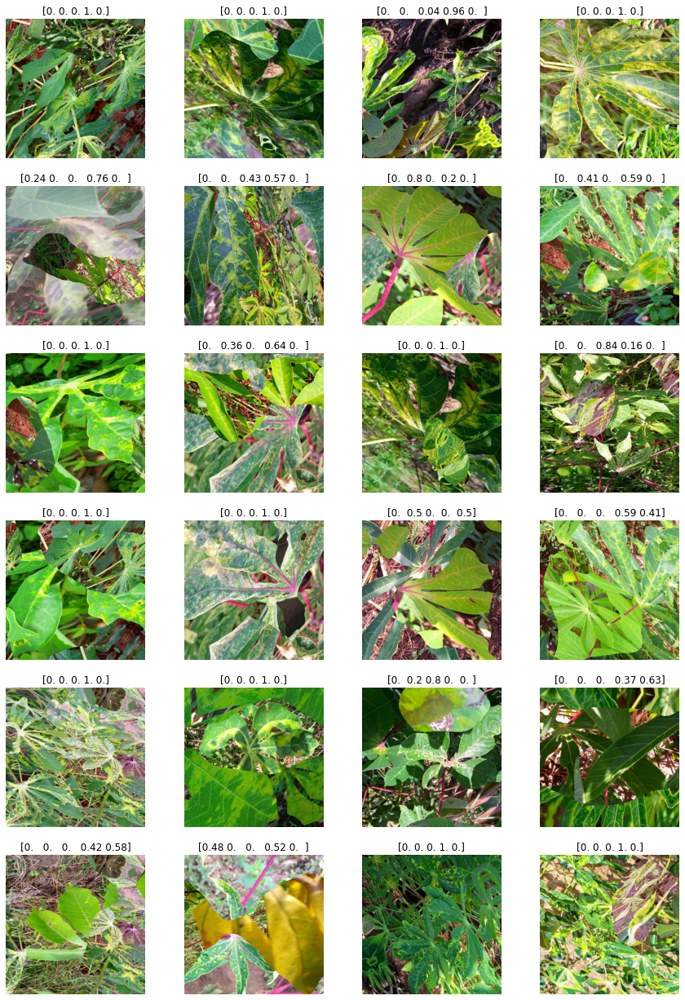

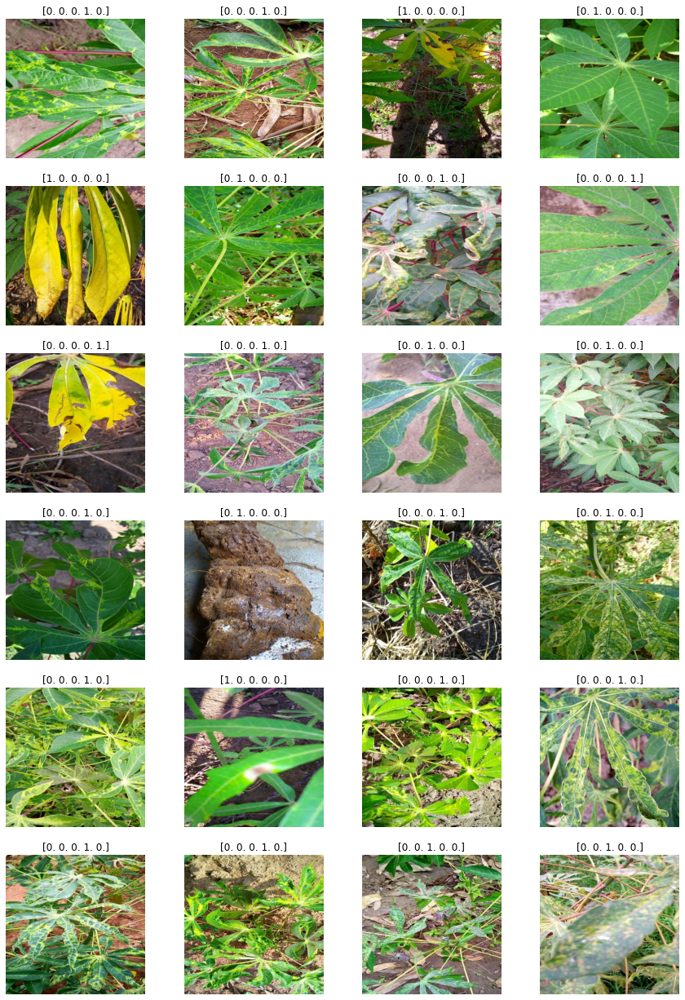

94108

In [16]:
train_ds = get_training_dataset(TRAINING_FILENAMES, do_aug = CFG["DO_AUG"], do_mix_aug = CFG["DO_MIX_AUG"])
display_items(train_ds, 5, 6)

valid_ds = get_validation_dataset(TRAINING_FILENAMES)
display_items(valid_ds, 5, 6)

del train_ds, valid_ds; gc.collect()

# Model

In [17]:
def create_model():
    inputs = tf.keras.Input(INPUT_SHAPE)
    base_model = BaseModel(
        model_tag = CFG['MODEL_TAG'],
        weights = CFG["INITIAL_WEIGHTS"],
        freeze_bn = CFG["FREEZE_BN"],
        input_shape = INPUT_SHAPE,
    )()
    
    base = base_model(inputs)
    
    outputs = tf.keras.layers.Dense(CFG["NUM_CLASSES"])(base)
    model = tf.keras.models.Model(
        inputs = inputs,
        outputs = outputs,
    )
    
    if CFG["LOSS_TYPE"] == "CCE":
        loss = lambda yt, yp: tf.keras.losses.categorical_crossentropy(yt, yp, from_logits = True, label_smoothing = CFG["LABEL_SMOOTHING"])
    elif CFG["LOSS_TYPE"] == "BTL":
        loss = BiTemperedLogisticLoss(CFG["BI_TEMPERED_LOSS_T1"], CFG["BI_TEMPERED_LOSS_T2"], n_iter = CFG["N_ITER"], label_smoothing = CFG["LABEL_SMOOTHING"])
    else:
        raise NotImplementedError("ロス関数の定義が不明！")
    
    optimizer = tf.keras.optimizers.Adam(learning_rate = CFG["LEARNING_RATE"])
    metrics = [tf.keras.metrics.CategoricalAccuracy(name = "accuracy")]
    
    model.compile(
        loss = loss,
        optimizer = optimizer,
        metrics = metrics
    )
    
    return model

# Training

In [18]:
def read_tfrecord_ids(example):
    tfrecord_format = {
        "image_name": tf.io.FixedLenFeature([], tf.string)
    }
    example = tf.io.parse_single_example(example, tfrecord_format)
    image_id = example['image_name']
    return image_id

TEST_BATCH_SIZE = CFG["BATCH_SIZE"]

def get_ds_for_id(filenames):
    dataset = tf.data.TFRecordDataset(filenames, num_parallel_reads=AUTO) # automatically interleaves reads from multiple files
    dataset = dataset.map(lambda x:read_tfrecord_ids(x), num_parallel_calls=AUTO)
    dataset = dataset.batch(TEST_BATCH_SIZE)
    return dataset
    
def get_ds_for_prediction(filenames):
    do_aug = (CFG["DO_AUG"] and (CFG["TTA"] >= 2))
    dataset = load_dataset(filenames, labeled = True, ordered = True)
    dataset = dataset.repeat(CFG["TTA"])
    if do_aug: dataset = dataset.map(single_augment, num_parallel_calls=AUTO)
    dataset = dataset.batch(TEST_BATCH_SIZE)
    dataset = dataset.prefetch(AUTO) # prefetch next batch while training (autotune prefetch buffer size)
    return dataset

def make_prediction(filenames, model):
    result_df = pd.DataFrame()
    
    id_ds = get_ds_for_id(filenames)
    image_ids = np.concatenate([image_id.astype("str") for image_id in id_ds.as_numpy_iterator()] * CFG["TTA"])

    dataset = get_ds_for_prediction(filenames)
    preds = model.predict(dataset, verbose = 1)

    result_df["image_id"] = image_ids
    for i in range(CFG["NUM_CLASSES"]):
        result_df[f"label_{i}"] = preds[:, i]
    
    result_df = result_df.groupby("image_id").mean()
    
    return result_df

In [19]:
# learning rate scheduler(batchwise callback)
class BatchwiseCosineAnnealingScheduler(tf.keras.callbacks.Callback):
    def __init__(self, steps_per_epoch):
        super().__init__()
        self.step = 0
        self.steps_per_epoch = steps_per_epoch
        self.warmup_steps = CFG["LR_FIRST_DECAY_STEPS"] * self.steps_per_epoch
        self.lr_max = CFG["LEARNING_RATE"]
        self.total_steps = (CFG["EPOCHS"] + CFG["EPOCHS_POST"]) * self.steps_per_epoch
        
    @tf.function
    def lrfn(self, step):
        if step < self.warmup_steps:
            lr = (self.lr_max - 1e-08) / self.warmup_steps * step + 1e-08
        else:
            progress = (step - self.warmup_steps) / (self.total_steps - self.warmup_steps)
            lr = self.lr_max * (0.5 * (1.0 + tf.math.cos(np.pi * (progress))))
            lr = tf.math.maximum(1e-08, float(lr))
        return lr
        
    def on_train_batch_end(self, batch, logs = None):
        tf.keras.backend.set_value(self.model.optimizer.lr, self.lrfn(self.step))
        self.step += 1


In [20]:
seed_everything(CFG["SEED"])

history_ls = []

oof_prob = pd.DataFrame()

kf = KFold(CFG["FOLDS"], random_state = CFG["FOLDS_SEED"], shuffle = True)

for fold, (train_idx, valid_idx) in enumerate(kf.split(TRAINING_FILENAMES)):
    print("#" * 30, f"fold {fold + 1}/{CFG['FOLDS']}", "#" * 30)
    
    if tpu:
        print("Initializing TPU")
        tf.tpu.experimental.initialize_tpu_system(tpu)
    
    if CFG["USE_EXTERNAL_DATA"]:
        train_filenames = np.random.permutation(
            np.concatenate(
                [
                    TRAINING_FILENAMES[train_idx],
                    TRAINING_FILENAMES_EXT[np.concatenate([train_idx + 15 * i for i in range(5)])]
                ]
            )
        )
    else:
        train_filenames = np.random.permutation(TRAINING_FILENAMES[train_idx])
    valid_filenames = TRAINING_FILENAMES[valid_idx]
    
    train_images_count = int(count_data_items(train_filenames))
    valid_images_count = int(count_data_items(valid_filenames))
    print(f'Dataset: {train_images_count} training images, {valid_images_count} validation images')

    STEPS_PER_EPOCH = train_images_count // CFG["BATCH_SIZE"] + 1

    train_ds = get_training_dataset(train_filenames, do_aug = CFG["DO_AUG"], do_mix_aug = CFG["DO_MIX_AUG"])
    valid_ds = get_validation_dataset(valid_filenames)

    
    weights_file_path = "weights" + f"_{CFG['MODEL_TAG']}" + f"_fold{fold}" + ".h5"
    mc_callback = tf.keras.callbacks.ModelCheckpoint(filepath = weights_file_path, monitor = CFG["MC_MONITOR"], save_weights_only = True, save_best_only = True)
    es_callback = tf.keras.callbacks.EarlyStopping(monitor = CFG["ES_MONITOR"], min_delta = CFG["ES_MIN_DELTA"], patience = CFG["ES_PATIENCE"], restore_best_weights = True, verbose = 1)
    lr_callback = BatchwiseCosineAnnealingScheduler(STEPS_PER_EPOCH)
    if CFG["EARLY_STOPPING"]: callbacks = [mc_callback, lr_callback, es_callback]
    else: callbacks = [mc_callback, lr_callback]
    
    with strategy.scope():
        model = create_model()

    history = model.fit(
        train_ds,
        validation_data = valid_ds,
        epochs = CFG["EPOCHS"],
        steps_per_epoch = STEPS_PER_EPOCH,
        callbacks = callbacks,
        verbose = 1
    )
    
    train_ds = get_training_dataset(train_filenames, do_aug = CFG["DO_AUG"], do_mix_aug = False)
    history2 = model.fit(
        train_ds,
        validation_data = valid_ds,
        initial_epoch = CFG["EPOCHS"],
        epochs = CFG["EPOCHS"] + CFG["EPOCHS_POST"],
        steps_per_epoch = STEPS_PER_EPOCH,
        callbacks = callbacks,
        verbose = 1
    )
    for k in history.history.keys():
        history.history[k] += history2.history[k]
    
    history_ls.append(history)
    
    model.save_weights(weights_file_path)
    model.load_weights(weights_file_path)

    # make oof prediction
    print("Prediction")
    _oof_prob = make_prediction(valid_filenames, model)
    oof_prob = pd.concat([oof_prob, _oof_prob])

############################## fold 1/5 ##############################
Initializing TPU
Dataset: 21067 training images, 4280 validation images
115261440/115255328 [==============================] - 2s 0us/step
Epoch 1/25
83/83 [==============================] - 86s 1s/step - loss: 0.2747 - accuracy: 0.5863 - val_loss: 0.2495 - val_accuracy: 0.7250
Epoch 2/25
83/83 [==============================] - 56s 678ms/step - loss: 0.1822 - accuracy: 0.7058 - val_loss: 0.1544 - val_accuracy: 0.8407
Epoch 3/25
83/83 [==============================] - 55s 660ms/step - loss: 0.1449 - accuracy: 0.7651 - val_loss: 0.1357 - val_accuracy: 0.8654
Epoch 4/25
83/83 [==============================] - 55s 664ms/step - loss: 0.1287 - accuracy: 0.7946 - val_loss: 0.1271 - val_accuracy: 0.8741
Epoch 5/25
83/83 [==============================] - 52s 621ms/step - loss: 0.1297 - accuracy: 0.7912 - val_loss: 0.1454 - val_accuracy: 0.8500
Epoch 6/25
83/83 [==============================] - 53s 634ms/step - loss: 0.1

In [21]:
oof_prob

,label_0,label_1,label_2,label_3,label_4
image_id,,,,,
1000201771.jpg,-4.176074,-2.050742,-2.007756,8.168240,-2.034114
1000837476.jpg,-2.030391,-2.239447,-1.805162,7.137145,-2.582288
1001749118.jpg,-2.731947,-1.886712,-2.988905,7.885294,-1.629337
1003888281.jpg,0.087880,1.842356,-5.247114,-3.060486,6.745498
1003987001.jpg,-2.922650,-2.577236,-1.770805,8.637594,-3.351585
...,...,...,...,...,...
992163916.jpg,-3.045912,-2.147880,1.024356,6.765105,-2.765782
993130539.jpg,-3.082597,-2.594226,-1.237065,7.716338,-0.848737
996762577.jpg,-2.855242,-3.143147,-2.485917,7.315135,0.867805


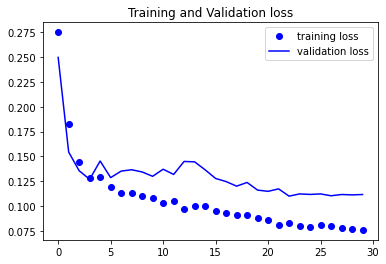

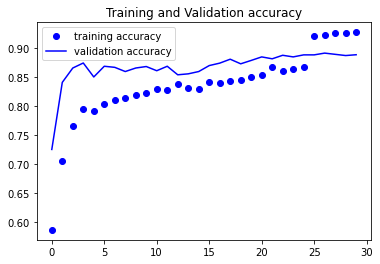

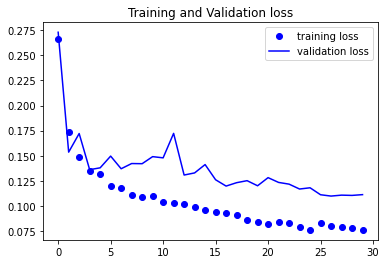

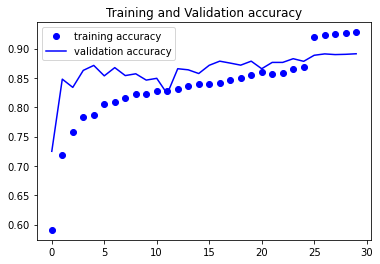

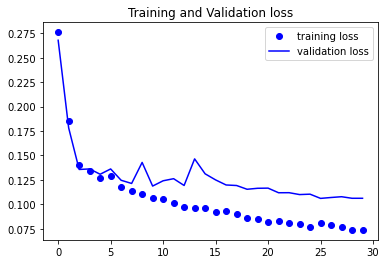

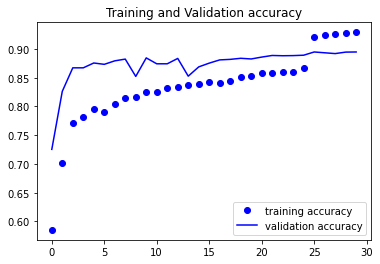

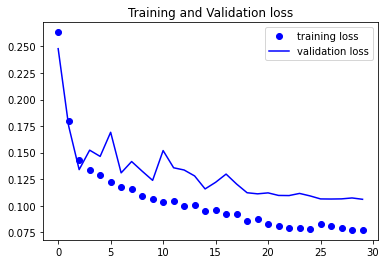

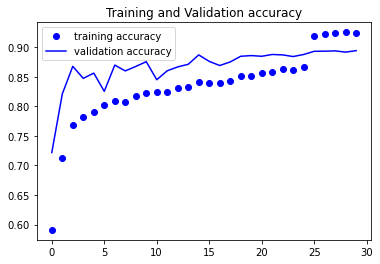

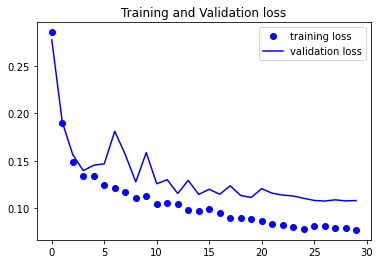

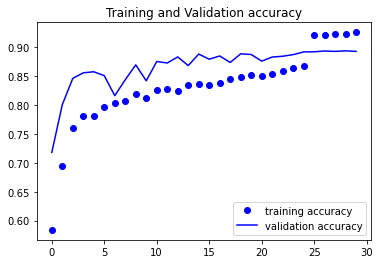

In [22]:
def compare_TV(history):
    import matplotlib.pyplot as plt

    # Setting Parameters
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']

    epochs = range(len(acc))

    plt.plot(epochs, loss, 'bo' ,label = 'training loss')
    plt.plot(epochs, val_loss, 'b' , label= 'validation loss')
    plt.title('Training and Validation loss')
    plt.legend()

    plt.figure()

    plt.plot(epochs, acc, 'bo' ,label = 'training accuracy')
    plt.plot(epochs, val_acc, 'b' , label= 'validation accuracy')
    plt.title('Training and Validation accuracy')
    plt.legend()

    plt.show()

for h in history_ls:
    compare_TV(h)

# Evaluation

In [23]:
oof_prob = oof_prob.groupby("image_id").mean()
oof_prob.to_csv("oof_probabilities.csv")
oof = oof_prob.copy()
oof["label"] = np.argmax(oof.values, axis = 1)
oof = oof[["label"]]
oof.to_csv("oof.csv")
oof_target_df = oof.reset_index()[["image_id"]].merge(train_df, on = "image_id", how = "inner").set_index("image_id")

oof_score = accuracy_score(oof_target_df['label'], oof['label'])
print(f"OOF Categorical Accuracy Score: {oof_score}")

OOF Categorical Accuracy Score: 0.8946015424164524


In [24]:
# confusion matrix
conf_mat = pd.DataFrame(
    confusion_matrix(oof_target_df["label"], oof["label"]),
    index = [["True"] * CFG["NUM_CLASSES"], list(range(CFG["NUM_CLASSES"]))],
    columns = [["Pred"] * CFG["NUM_CLASSES"], list(range(CFG["NUM_CLASSES"]))]
)
display(conf_mat)

Pred                         
          0     1     2      3     4
True 0  755    83    18     45   185
     1  102  1798    55     78   156
     2   38    47  1926    252   123
     3   27    65   145  12823    98
     4  237   159   145    197  1838

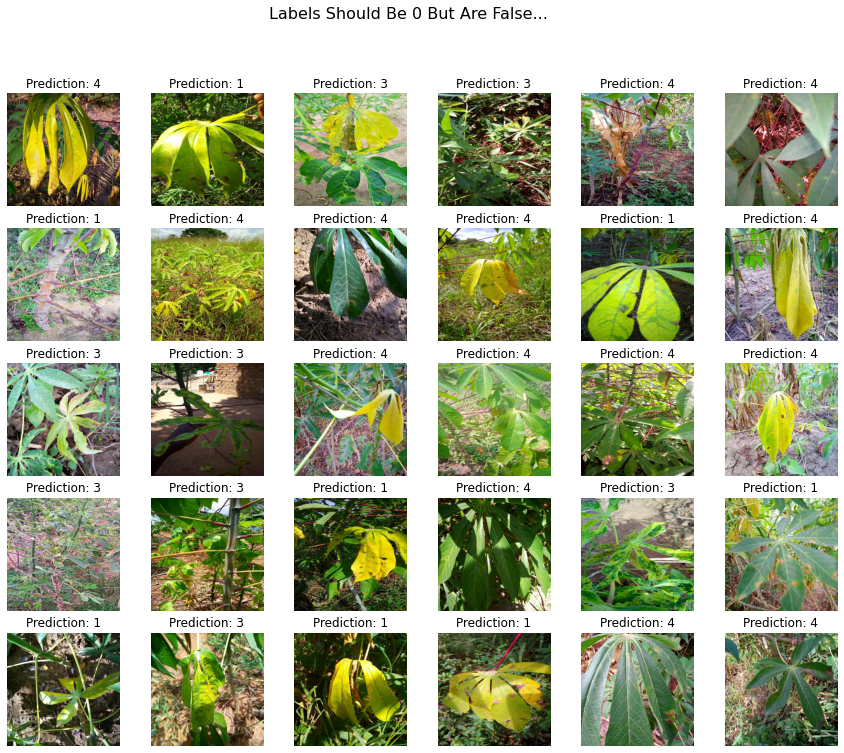

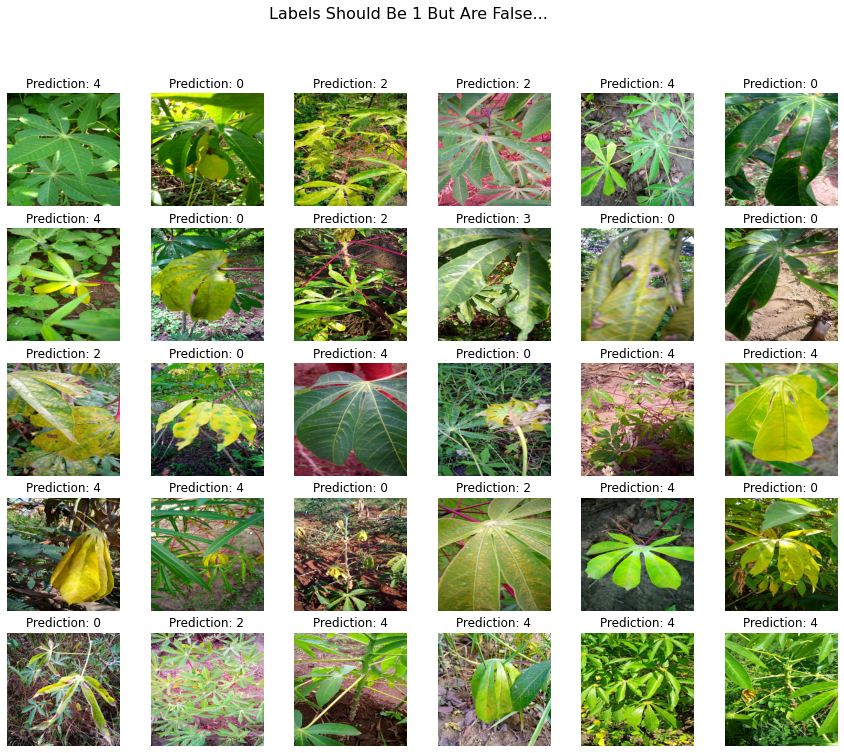

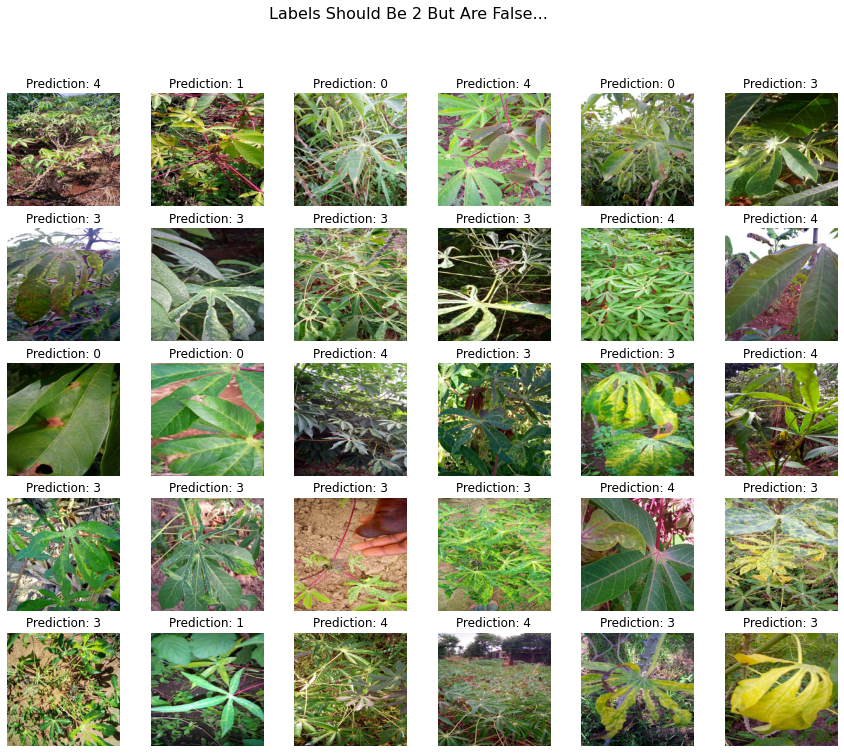

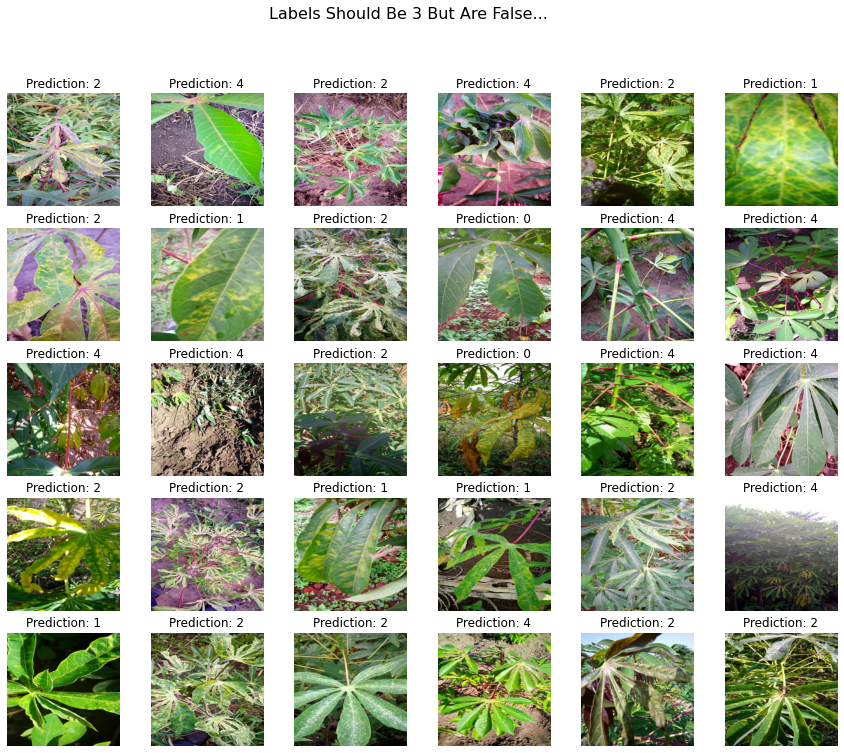

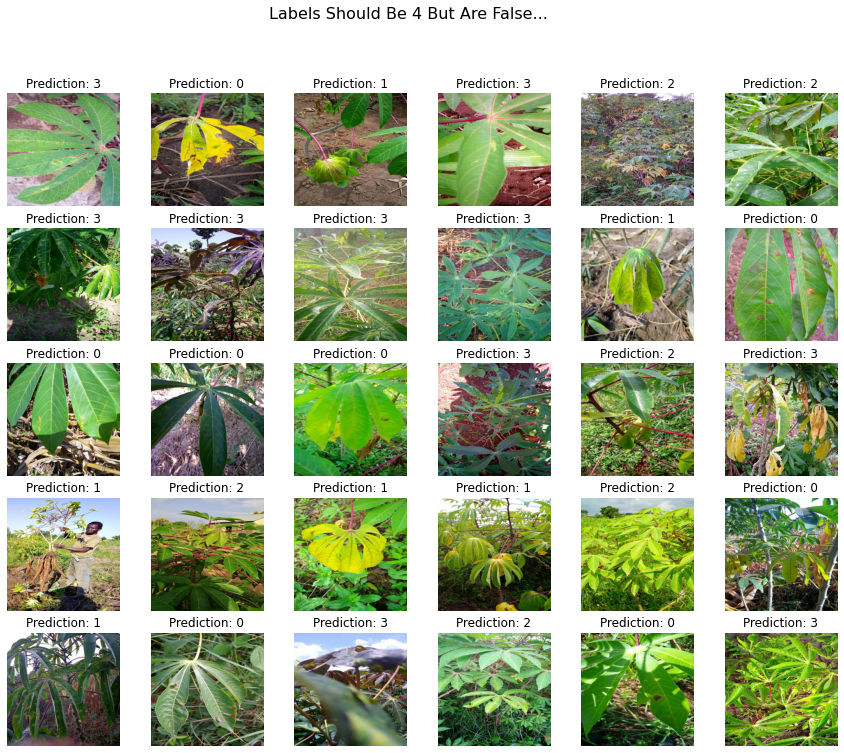

In [25]:
# False Records
def plot_false_images(label):
    row = 5
    col = 6
    ds = get_test_dataset(TRAINING_FILENAMES).unbatch()
    _target_df = oof_target_df.sort_index()
    _oof = oof.sort_index()
    false_df = _oof[(_target_df["label"] == label) & (_target_df["label"] != _oof["label"])]
    imgs = []
    label_infos = []
    cnt = 0
    for (img, img_id) in ds:
        img_id = img_id.numpy().decode()
        if img_id in false_df.index:
            imgs.append(img)
            label_infos.append(f"Prediction: {_oof.loc[img_id][0]}")
            cnt += 1
        if cnt >= row*col: break

    fig = plt.figure(figsize=(15,int(15*row/col)))
    fig.suptitle(f'Labels Should Be {label} But Are False...', fontsize=16)

    for i, (img,title) in enumerate(zip(imgs, label_infos)):
        plt.subplot(row,col,i+1)
        plt.axis('off')
        plt.title(title)
        if CFG["IMAGE_NORMALIZATION"]: _img = inverse_preprocess_normalization(img)
        else: _img = img
        plt.imshow(_img.numpy())
    plt.show()

for label in range(CFG["NUM_CLASSES"]):
    plot_false_images(label)

In [26]:
RESULT = {
    "public_score": None,
    "oof_score": oof_score
}

In [27]:
with open(f"/kaggle/working/configuration.json", "w") as f:
    json.dump(CFG, f)
    
with open(f"/kaggle/working/result.json", "w") as f:
    json.dump(RESULT, f)